### Import required modules

In [1]:
import warnings
warnings.filterwarnings('ignore')
from IPython.display import Image


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


import plotly_express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

# Classifier Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import collections


from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import make_pipeline as imbalanced_make_pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from scipy.stats import norm
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

import keras
from keras.models import Sequential
from keras.layers import Activation
from keras.layers.core import Dense
from keras.optimizers import Adam
from keras.metrics import categorical_crossentropy

%matplotlib inline

### Data Preprocessing
The dataset is provided by Kaggle and contains transactions made by credit cards in September 2013 by European cardholders. This dataset presents transactions that occurred in two days, where we have 492 frauds out of 284,807 transactions. The dataset is highly unbalanced, the positive class (frauds) account for 0.172% of all transactions.

It contains only numerical input variables which are the result of a PCA transformation. Unfortunately, due to confidentiality issues, the original features and more background information about the data could not be provided. Features V1, V2, ... V28 are the principal components obtained with PCA, the only features which have not been transformed with PCA are 'Time' and 'Amount'. Feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset. The feature 'Amount' is the transaction Amount, this feature can be used for example-dependant cost-sensitive learning. Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise.


In [2]:
df = pd.read_csv('creditcard.csv')
data_copy = df.copy()
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


Columns of the credit card dataset.
There are 31 columns.

In [3]:
df.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

### Handling missing values

There are no null values in the dataframe.

In [4]:
df.isnull().values.any()

False

Descriptive statistics of numerical column.

In [5]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,...,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


> Since, the dataset contains no null or missing values and all the features seem to be scaled properly, there seems to be no need of any preprocessing. Only the features Time & Amount are required to be scaled.

### Feature Scaling

It refers to putting the values in the same range or same scale so that no variable is dominated by the other.

1. Columns 'Amount' & 'Time' are not scaled.
2. Use RobustScaler for scaling.


In [6]:
rob_scaler = RobustScaler()
df['scaled_time'] = rob_scaler.fit_transform(df['Time'].values.reshape(-1,1))
df['scaled_amount'] = rob_scaler.fit_transform(df['Amount'].values.reshape(-1,1))
df.drop(['Time','Amount'], axis=1, inplace=True)

scaled_amount = df['scaled_amount']
scaled_time = df['scaled_time']

#scaled_amount and scaled_time are added to the starting of the dataframe
df.drop(['scaled_amount', 'scaled_time'], axis=1, inplace=True)
df.insert(0, 'scaled_amount', scaled_amount)
df.insert(1, 'scaled_time', scaled_time)

df.head()

,scaled_amount,scaled_time,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
0,1.783274,-0.994983,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0
1,-0.269825,-0.994983,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0
2,4.983721,-0.994972,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0
3,1.418291,-0.994972,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0
4,0.670579,-0.994960,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0


### Exploratory Data Analysis

#### 1. Comparing the number of Fraud vs Non-Fraud cases. 
Percentage of No Frauds: 99.83%
 | Percentage of Frauds: 0.17%

In [7]:
group = df.groupby('Class')['scaled_time'].count()

fig = go.Figure()
fig.add_trace(go.Bar(name='counts',x=group.index, y=group.values, text=group.values,textposition='outside'))

fig.update_yaxes(title_text='Number of Cases')
fig.update_xaxes(title_text='Case',nticks=3)

fig.update_layout(template='seaborn',title='Number of Fraud vs Non-Fraud Cases',width=900,height=600)
fig.show()

#### 2.Comparing Amount/Transaction for two categories.

Fraud cases have happened the most for small amounts.

In [8]:
fraud = data_copy[data_copy['Class']==1]
normal = data_copy[data_copy['Class']==0]

fig = make_subplots(rows=2,cols=1,subplot_titles=['Amount/Transaction for Fraud', 'Amount/Transaction for Normal'])

fig.add_trace(go.Histogram(name='Amount',x=fraud.Amount),1,1)
fig.update_xaxes(mirror=True,title_text="Amount",row=1,col=1)
fig.update_yaxes(mirror=True,title_text="Number of Transaction",row=1,col=1)

fig.add_trace(go.Histogram(name='Amount',x=normal.Amount),2,1)
fig.update_xaxes(mirror=True,title_text="Amount",row=2,col=1)
fig.update_yaxes(mirror=True,title_text="Number of Transaction",row=2,col=1)

fig.update_layout(template='seaborn',width=900,height=500)
fig.show()

### Random Under Sampling

Due to the imbalance in the dataset, Random Unsampling is used to undersample the majority class(Non-Fraud) to get equal distribution of both categories. This is done for the purpose of EDA.

In [9]:
X = df.drop('Class', axis=1)
y = df['Class']

rand_undersampler = RandomUnderSampler(random_state=42)
X_rand_undersample, y_rand_undersample = rand_undersampler.fit_sample(X,y)

df_undersample = pd.DataFrame(np.hstack((X_rand_undersample,y_rand_undersample[:, None])), columns=df.columns)
df_undersample.Class = df_undersample.Class.astype(int)
df_undersample.head()

,scaled_amount,scaled_time,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
0,-0.296793,-0.026340,1.314539,0.590643,-0.666593,0.716564,0.301978,-1.125467,0.388881,-0.288390,...,-0.058040,-0.170307,-0.429655,-0.141341,-0.200195,0.639491,0.399476,-0.034321,0.031692,0
1,-0.249004,-0.401062,-0.798672,1.185093,0.904547,0.694584,0.219041,-0.319295,0.495236,0.139269,...,-0.081298,0.202287,0.578699,-0.092245,0.013723,-0.246466,-0.380057,-0.396030,-0.112901,0
2,-0.097813,-0.347361,-0.391128,-0.245540,1.122074,-1.308725,-0.639891,0.008678,-0.701304,-0.027315,...,0.065716,-0.133485,0.117403,-0.191748,-0.488642,-0.309774,0.008100,0.163716,0.239582,0
3,0.489066,0.374534,-0.060302,1.065093,-0.987421,-0.029567,0.176376,-1.348539,0.775644,0.134843,...,-0.169706,0.355576,0.907570,-0.018454,-0.126269,-0.339923,-0.150285,-0.023634,0.042330,0
4,-0.307413,0.067458,1.848433,0.373364,0.269272,3.866438,0.088062,0.970447,-0.721945,0.235983,...,-0.282777,0.103563,0.620954,0.197077,0.692392,-0.206530,-0.021328,-0.019823,-0.042682,0


### Heatmaps

Determining how close a feature is related to the target column. In other words, how different columns determine a fraud or non-fraud transaction.

#### 1. Heatmap on Original Data
The original dataset is imbalanced. It is not a good indicator to know feautre importance. Most of the features does not show any correlation.

#### 2. Heatmap on Random Under-Sampled Data;
The under-sampled dataset is balanced. It is a good indicator to know feautre importance. Features does show correlations.

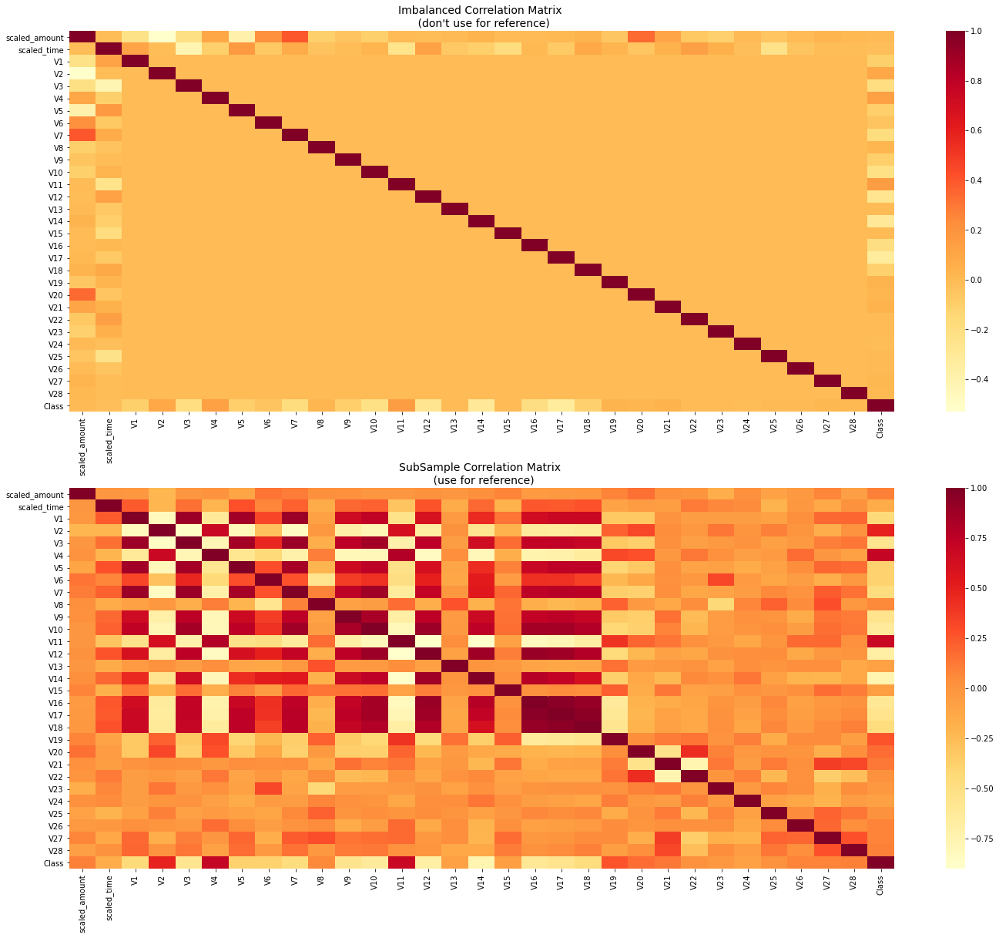

In [10]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(24,20))

# Entire DataFrame
corr = df.corr()
sns.heatmap(corr, cmap='YlOrRd', annot_kws={'size':20}, ax=ax1)
ax1.set_title("Imbalanced Correlation Matrix \n (don't use for reference)", fontsize=14)


sub_sample_corr = df_undersample.corr()
sns.heatmap(sub_sample_corr, cmap='YlOrRd', annot_kws={'size':20}, ax=ax2)
ax2.set_title('SubSample Correlation Matrix \n (use for reference)', fontsize=14)
plt.show()

Findings on the correlation between all the features and the 'Class' column:

#### Positive Correlation
Features **V2, V4, V11 & V19** show positive correlation with class. The higher the values of these features, the higher the chances of a transaction being fraudulant.

#### Negative Correlation 
Features **V10, V12, V14 & V17** show negative correlation with class. The lower the values of these features, the higher the chances of a transaction being fraudulant.

### Histograms

#### First Histogram
The first row of histograms shows the distribution of positively correlated features with Class: **V2, V4, V11 & V19**

#### Second Histogram
The second row of histograms shows the distribution of negatively correlated features with Class: **V10, V12, V14 & V17**


In [11]:
fig = make_subplots(rows=2,cols=4,vertical_spacing=0.15,
                    subplot_titles=['V2 Distribution', 'V4 Distribution', 'V11 Distribution', 'V19 Distribution',
                                    'V10 Distribution', 'V12 Distribution', 'V14 Distribution', 'V17 Distribution'])

features = ['V2','V4','V11','V19','V10','V12','V14','V17']

for r in range(1,3):
    for c in range(1, 5):
        fig.add_trace(go.Histogram(name=features[r+c-2],x=df.loc[df.Class==1,features[r+c-2]]),r,c)
        fig.update_xaxes(mirror=True,linewidth=2,linecolor='black',row=r,col=c)
        fig.update_yaxes(mirror=True,linewidth=2,linecolor='black',row=r,col=c)
        
fig.update_layout(template='seaborn',title='Feature Distributions for Fraud Transactions')
fig.show()

### Boxplots

Visualized boxplots for both positive and negative correlated features.

In [12]:

features = ['V2','V4','V11','V19']

fig = make_subplots(rows=1,cols=4,subplot_titles=['V2 vs Class','V4 vs Class','V11 vs Class','V19 vs Class'])

for r in range(1,2):
    for c in range(1,5):
        fig.add_trace(go.Box(name=features[r+c-2],x=df_undersample['Class'],y=df_undersample[features[r+c-2]]),r,c)
        fig.update_xaxes(mirror=True,row=r,col=c)
        fig.update_yaxes(mirror=True,row=r,col=c)
        
fig.update_layout(width=900,template='seaborn',title='Boxplots for Positive Correlations')


In [13]:
features = ['V10','V12','V14','V17']

fig = make_subplots(rows=1,cols=4,subplot_titles=['V10 vs Class','V12 vs Class','V14 vs Class','V17 vs Class'])

for r in range(1,2):
    for c in range(1,5):
        fig.add_trace(go.Box(name=features[r+c-2],x=df_undersample['Class'],y=df_undersample[features[r+c-2]]),r,c)
        fig.update_xaxes(mirror=True,row=r,col=c)
        fig.update_yaxes(mirror=True,row=r,col=c)
        
fig.update_layout(width=900,template='seaborn',title='Boxplots for Negative Correlations')



### Outlier Removal

Outlier removed from the **V10** and **V2** features as they have the maximum outliers as shown in the above boxplots using the inter-quartile ranges method.


In [14]:
def outlier_detection_removal(data,feature, fraud):
    
    array = data[feature].loc[data['Class'] == fraud].values 
    q25 = np.percentile(array, 25)
    q75 = np.percentile(array,75)
    iqr = q75 - q25

    cutoff = iqr*1.5
    lower_threshold = q25 - cutoff
    upper_threshold = q75 + cutoff

    outliers = [a for a in array if a < lower_threshold or a > upper_threshold]
    print('\nNumber of outliers detected for feature {}: {}'.format(feature,len(outliers)))
    
    data = data.drop(data[(data[feature] > upper_threshold) | (data[feature] < lower_threshold)].index)
    print('\nNumber of records after outlier removal: {}'.format(len(data)))
    return data

In [15]:
df_undersample_clean = outlier_detection_removal(df_undersample,'V10', 1)
df_undersample_clean = outlier_detection_removal(df_undersample_clean,'V2',1)


Number of outliers detected for feature V10: 19

Number of records after outlier removal: 963

Number of outliers detected for feature V2: 41

Number of records after outlier removal: 913


Below we can see the boxplots representing the before and after state of the outliers for features *V10* and *V2*. It is clearly evident that the number of outliers have reduced after going through outlier removal. 

In [16]:
features=['V2','V10']
fig = make_subplots(rows=2,cols=2,
                    shared_yaxes=True,subplot_titles=[features[0]+' vs Class <br> (Before Outlier Removal)',
                                                      features[0]+' vs Class <br> (After Outlier Removal)',
                                                      features[1]+' vs Class <br> (Before Outlier Removal)',
                                                      features[1]+' vs Class <br> (After Outlier Removal)'])
for r in range(1,3):
    fig.add_trace(go.Box(name=features[r-1]+'(Before)',x=df_undersample['Class'],y=df_undersample[features[r-1]]),r,1)
    fig.add_trace(go.Box(name=features[r-1]+'(After)',x=df_undersample_clean['Class'],y=df_undersample_clean[features[r-1]]),r,2)
    fig.update_xaxes(mirror=True,row=r,col=1)
    fig.update_yaxes(mirror=True,row=r,col=1)
    fig.update_xaxes(mirror=True,row=r,col=2)
    fig.update_yaxes(mirror=True,row=r,col=2)
    
fig.update_layout(width=900,template='seaborn',title='Comparison of Box Plots after outlier removal')
fig.show()



### Classifiers used

- **Logistic Regression**
- **Support Vector Classifier**
- **Decision Tree**
- **KNearest Classifier**


In [17]:
log_reg = LogisticRegression()
svc = SVC()
decision_tree = DecisionTreeClassifier()
knearest = KNeighborsClassifier()

classifier = [log_reg,svc,decision_tree,knearest]
c_name = ["Logistic Reg", "SVC", "Decision Tree", "K Nearest"]

### Performing Cross-Validation to split the data

In [18]:
original_X = df.drop('Class',axis=1)
original_y = df['Class']

sss = StratifiedKFold(n_splits=5, random_state=None, shuffle=False)

for train_index, test_index in sss.split(original_X, original_y):
    print("Train: {} Test: {}".format(train_index, test_index))
    original_Xtrain, original_Xtest = original_X.iloc[train_index], original_X.iloc[test_index]
    original_ytrain, original_ytest = original_y.iloc[train_index], original_y.iloc[test_index]
    
#Turn into arrays    
original_Xtrain = original_Xtrain.values
original_Xtest = original_Xtest.values
original_ytrain = original_ytrain.values
original_ytest = original_ytest.values

Train: [ 30473  30496  31002 ... 284804 284805 284806] Test: [    0     1     2 ... 57017 57018 57019]
Train: [     0      1      2 ... 284804 284805 284806] Test: [ 30473  30496  31002 ... 113964 113965 113966]
Train: [     0      1      2 ... 284804 284805 284806] Test: [ 81609  82400  83053 ... 170946 170947 170948]
Train: [     0      1      2 ... 284804 284805 284806] Test: [150654 150660 150661 ... 227866 227867 227868]
Train: [     0      1      2 ... 227866 227867 227868] Test: [212516 212644 213092 ... 284804 284805 284806]


### UnderSampling

Perform Undersampling using Nearmiss technique and it is performed during cross-validation.

In [19]:
X_nearmiss, y_nearmiss = NearMiss().fit_sample(original_X.values, original_y.values)

Create a function that creates a pipeline having an undersample model for each classifier trained on the undersampled Cross-Validated data. It returns different metrics and the created model.

In [20]:
def undersample_pred(original_Xtrain,original_ytrain,classifier):
    
    pipelines = []
    models = []
    
    undersample_accuracy_lst = []
    undersample_precision_lst = []
    undersample_recall_lst = []
    undersample_f1_lst = []

    for train, test in sss.split(original_Xtrain, original_ytrain):
        pipeline = imbalanced_make_pipeline(NearMiss(sampling_strategy='majority'), classifier)
        pipelines.append(pipeline)
        
        undersample_model = pipeline.fit(original_Xtrain[train], original_ytrain[train])
        models.append(undersample_model)
        
        
        prediction = undersample_model.predict(original_Xtrain[test])

        undersample_accuracy_lst.append(pipeline.score(original_Xtrain[test], original_ytrain[test]))
        undersample_precision_lst.append(precision_score(original_ytrain[test], prediction))
        undersample_recall_lst.append(recall_score(original_ytrain[test], prediction))
        undersample_f1_lst.append(f1_score(original_ytrain[test], prediction))

        
        return [undersample_accuracy_lst[0],undersample_precision_lst[0],
                undersample_recall_lst[0],undersample_f1_lst[0], pipelines[0], models[0]]


In [21]:
undersample_metrics_data = {}
undersample_models = []

for i,j in zip(classifier, c_name):
    result = undersample_pred(original_Xtrain,original_ytrain,i)
    undersample_metrics_list= result[0:4]
    
    undersample_models.append(result[5])
    undersample_metrics_data[j] = undersample_metrics_list
    

Table showing metrics from various Classifiers models

In [22]:
undersample_metrics_data = pd.DataFrame(data=undersample_metrics_data)
undersample_metrics_data.index = ["Accuracy","Precision","Recall","F1"]
undersample_metrics_data

,Logistic Reg,SVC,Decision Tree,K Nearest
Accuracy,0.375115,0.819245,0.049353,0.742989
Precision,0.002732,0.008909,0.001751,0.006365
Recall,0.987342,0.936709,0.962025,0.949367
F1,0.005448,0.017651,0.003496,0.012645


Classification report for all the models generated from the predictions of the test data

In [23]:
labels = ['No Fraud', 'Fraud']

for i,j in zip(undersample_models,c_name):
    print(j)
    undersample_prediction = i.predict(original_Xtest)
    print(classification_report(original_ytest, undersample_prediction, target_names=labels))

Logistic Reg
              precision    recall  f1-score   support

    No Fraud       1.00      0.65      0.79     56863
       Fraud       0.00      0.94      0.01        98

    accuracy                           0.65     56961
   macro avg       0.50      0.80      0.40     56961
weighted avg       1.00      0.65      0.79     56961

SVC
              precision    recall  f1-score   support

    No Fraud       1.00      0.85      0.92     56863
       Fraud       0.01      0.92      0.02        98

    accuracy                           0.85     56961
   macro avg       0.51      0.88      0.47     56961
weighted avg       1.00      0.85      0.92     56961

Decision Tree
              precision    recall  f1-score   support

    No Fraud       1.00      0.10      0.19     56863
       Fraud       0.00      0.95      0.00        98

    accuracy                           0.10     56961
   macro avg       0.50      0.53      0.10     56961
weighted avg       1.00      0.10      0.19

### OverSampling

Perform OverSampling using SMOTE technique and it is performed during cross-validation.

Create a function that creates a pipeline having an OverSample model for each classifier trained on the OverSample Cross-Validated data. It returns different metrics and the created model.

In [24]:
def oversample_pred(original_Xtrain,original_ytrain,classifier):
    
    pipelines = []
    models = []
    
    oversample_accuracy_lst = []
    oversample_precision_lst = []
    oversample_recall_lst = []
    oversample_f1_lst = []

    for train, test in sss.split(original_Xtrain, original_ytrain):
        pipeline = imbalanced_make_pipeline(SMOTE(sampling_strategy='minority'), classifier)
        pipelines.append(pipeline)
        
        model = pipeline.fit(original_Xtrain[train], original_ytrain[train])
        models.append(model)
        
        prediction = model.predict(original_Xtrain[test])

        oversample_accuracy_lst.append(pipeline.score(original_Xtrain[test], original_ytrain[test]))
        oversample_precision_lst.append(precision_score(original_ytrain[test], prediction))
        oversample_recall_lst.append(recall_score(original_ytrain[test], prediction))
        oversample_f1_lst.append(f1_score(original_ytrain[test], prediction))
        
        return [oversample_accuracy_lst[0],oversample_precision_lst[0],
                oversample_recall_lst[0],oversample_f1_lst[0], pipelines[0], models[0]]
        
        

In [25]:
oversample_metrics_data = {}
oversample_models = []
for i,j in zip(classifier, c_name):
    result = oversample_pred(original_Xtrain,original_ytrain,i)
    oversample_metrics_list= result[0:4]
    
    oversample_models.append(result[5])
    oversample_metrics_data[j] = oversample_metrics_list

Table showing metrics from various Classifiers models

In [26]:
oversample_metrics_data = pd.DataFrame(data=oversample_metrics_data)
oversample_metrics_data.index = ["Accuracy","Precision","Recall","F1"]
oversample_metrics_data

,Logistic Reg,SVC,Decision Tree,K Nearest
Accuracy,0.789906,0.945995,0.808449,0.992341
Precision,0.008184,0.023600,0.006954,0.180095
Recall,1.000000,0.746835,0.772152,0.962025
F1,0.016235,0.045754,0.013784,0.303393


Classification report for all the models generated from the predictions of the test data

In [27]:
labels = ['No Fraud', 'Fraud']

for i,j in zip(oversample_models,c_name):
    print(j)
    oversample_prediction = i.predict(original_Xtest)
    print(classification_report(original_ytest, oversample_prediction, target_names=labels))

Logistic Reg
              precision    recall  f1-score   support

    No Fraud       1.00      1.00      1.00     56863
       Fraud       0.36      0.85      0.50        98

    accuracy                           1.00     56961
   macro avg       0.68      0.92      0.75     56961
weighted avg       1.00      1.00      1.00     56961

SVC
              precision    recall  f1-score   support

    No Fraud       1.00      1.00      1.00     56863
       Fraud       0.33      0.71      0.45        98

    accuracy                           1.00     56961
   macro avg       0.66      0.86      0.72     56961
weighted avg       1.00      1.00      1.00     56961

Decision Tree
              precision    recall  f1-score   support

    No Fraud       1.00      1.00      1.00     56863
       Fraud       0.04      0.02      0.03        98

    accuracy                           1.00     56961
   macro avg       0.52      0.51      0.51     56961
weighted avg       1.00      1.00      1.00

### Hyper Parameter Tuning

In [28]:
params = {
    "Logistic Regression": {"penalty": ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]},
    "Support Vector Classifier": {'C': [0.5, 0.7, 0.9, 1], 'kernel': ['rbf', 'poly', 'sigmoid', 'linear']},
    "Decision Tree": {"criterion": ["gini", "entropy"], "max_depth": list(range(2,4,1)), 
              "min_samples_leaf": list(range(5,7,1))},
    "KNearest": {"n_neighbors": list(range(2,5,1)), 'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']}
}

In [29]:
rand_log_reg = RandomizedSearchCV(LogisticRegression(), params['Logistic Regression'], n_iter=30,cv=5)
rand_svc = RandomizedSearchCV(SVC(), params['Support Vector Classifier'],n_iter=30,cv=5)
rand_dt = RandomizedSearchCV(DecisionTreeClassifier(), params['Decision Tree'],n_iter=30,cv=5)
rand_knear = RandomizedSearchCV(KNeighborsClassifier(), params['KNearest'],n_iter=30,cv=5)

hypertuned_classifier = [rand_log_reg,rand_svc,rand_dt,rand_knear]

In [30]:
hyper_undersample_metrics_data = {}
hyper_undersample_metrics_models = []

for i,j in zip(hypertuned_classifier, c_name):
    result = undersample_pred(original_Xtrain, original_ytrain, i)
    hyper_undersample_metrics_list= result[0:4]
    
    hyper_undersample_metrics_models.append(result[5])
    hyper_undersample_metrics_data[j] = hyper_undersample_metrics_list

In [31]:
hyper_undersample_metrics_data = pd.DataFrame(data=hyper_undersample_metrics_data)
hyper_undersample_metrics_data.index = ["Accuracy","Precision","Recall","F1"]
hyper_undersample_metrics_data

,Logistic Reg,SVC,Decision Tree,K Nearest
Accuracy,0.375115,0.338095,0.100812,0.770529
Precision,0.002732,0.002612,0.001876,0.007030
Recall,0.987342,1.000000,0.974684,0.936709
F1,0.005448,0.005211,0.003744,0.013956


In [32]:
labels = ['No Fraud', 'Fraud']

for i,j in zip(hyper_undersample_metrics_models,c_name):
    print(j)
    hyper_undersample_prediction = i.predict(original_Xtest)
    print(classification_report(original_ytest, hyper_undersample_prediction, target_names=labels))

Logistic Reg
              precision    recall  f1-score   support

    No Fraud       1.00      0.65      0.79     56863
       Fraud       0.00      0.94      0.01        98

    accuracy                           0.65     56961
   macro avg       0.50      0.80      0.40     56961
weighted avg       1.00      0.65      0.79     56961

SVC
              precision    recall  f1-score   support

    No Fraud       1.00      0.60      0.75     56863
       Fraud       0.00      0.94      0.01        98

    accuracy                           0.60     56961
   macro avg       0.50      0.77      0.38     56961
weighted avg       1.00      0.60      0.75     56961

Decision Tree
              precision    recall  f1-score   support

    No Fraud       1.00      0.19      0.32     56863
       Fraud       0.00      0.96      0.00        98

    accuracy                           0.19     56961
   macro avg       0.50      0.58      0.16     56961
weighted avg       1.00      0.19      0.32

### Neural Network

#### UnderSample Dataset

In [33]:
X = df_undersample.drop('Class', axis=1)
y = df_undersample['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

n_inputs = X_train.shape[1]

nn_undersample_model = Sequential([
    Dense(n_inputs, input_shape=(n_inputs,), activation='relu'),
    Dense(32, activation='relu'),
    Dense(2, activation='softmax')
])

nn_undersample_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 30)                930       
_________________________________________________________________
dense_1 (Dense)              (None, 32)                992       
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 66        
Total params: 1,988
Trainable params: 1,988
Non-trainable params: 0
_________________________________________________________________


In [34]:
nn_undersample_model.compile(Adam(lr=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [35]:
nn_undersample_model.fit(X_train, y_train, validation_split=0.2, batch_size=25, epochs=30, shuffle=True, verbose=2)

Epoch 1/30
26/26 - 0s - loss: 0.7099 - accuracy: 0.6343 - val_loss: 0.4396 - val_accuracy: 0.6835
Epoch 2/30
26/26 - 0s - loss: 0.3560 - accuracy: 0.8219 - val_loss: 0.3187 - val_accuracy: 0.8861
Epoch 3/30
26/26 - 0s - loss: 0.2861 - accuracy: 0.9046 - val_loss: 0.2655 - val_accuracy: 0.9241
Epoch 4/30
26/26 - 0s - loss: 0.2446 - accuracy: 0.9221 - val_loss: 0.2287 - val_accuracy: 0.9304
Epoch 5/30
26/26 - 0s - loss: 0.2158 - accuracy: 0.9300 - val_loss: 0.2014 - val_accuracy: 0.9304
Epoch 6/30
26/26 - 0s - loss: 0.1930 - accuracy: 0.9396 - val_loss: 0.1790 - val_accuracy: 0.9367
Epoch 7/30
26/26 - 0s - loss: 0.1774 - accuracy: 0.9412 - val_loss: 0.1629 - val_accuracy: 0.9430
Epoch 8/30
26/26 - 0s - loss: 0.1628 - accuracy: 0.9428 - val_loss: 0.1493 - val_accuracy: 0.9494
Epoch 9/30
26/26 - 0s - loss: 0.1506 - accuracy: 0.9475 - val_loss: 0.1381 - val_accuracy: 0.9494
Epoch 10/30
26/26 - 0s - loss: 0.1399 - accuracy: 0.9491 - val_loss: 0.1305 - val_accuracy: 0.9494
Epoch 11/30
26/26 -

In [36]:
undersample_predictions = nn_undersample_model.predict(X_test, batch_size=200, verbose=0)

In [37]:
undersample_fraud_predictions = nn_undersample_model.predict_classes(X_test, batch_size=200, verbose=0)

Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).


In [38]:
import itertools

# Create a confusion matrix
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=14)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[92  7]
 [ 9 89]]
Confusion matrix, without normalization
[[99  0]
 [ 0 98]]


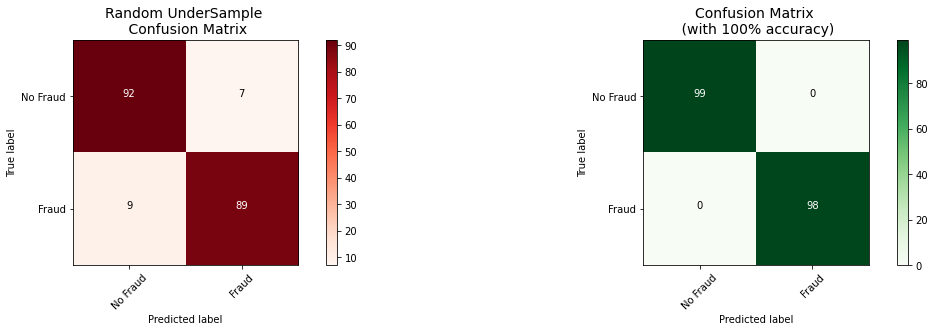

In [39]:
from sklearn.metrics import confusion_matrix
undersample_cm = confusion_matrix(y_test, undersample_fraud_predictions)
actual_cm = confusion_matrix(y_test, y_test)
labels = ['No Fraud', 'Fraud']

fig = plt.figure(figsize=(16,8))

fig.add_subplot(221)
plot_confusion_matrix(undersample_cm, labels, title="Random UnderSample \n Confusion Matrix", cmap=plt.cm.Reds)

fig.add_subplot(222)
plot_confusion_matrix(actual_cm, labels, title="Confusion Matrix \n (with 100% accuracy)", cmap=plt.cm.Greens)

In [40]:
undersample_fraud_predictions = nn_undersample_model.predict_classes(original_Xtest, batch_size=200, verbose=0)

print(classification_report(original_ytest, undersample_fraud_predictions, target_names=labels))

              precision    recall  f1-score   support

    No Fraud       1.00      0.95      0.98     56863
       Fraud       0.03      0.96      0.06        98

    accuracy                           0.95     56961
   macro avg       0.52      0.96      0.52     56961
weighted avg       1.00      0.95      0.97     56961



#### Oversampled Dataset

In [55]:
n_inputs = original_Xtrain.shape[1]

nn_oversample_model = Sequential([
    Dense(n_inputs, input_shape=(n_inputs, ), activation='relu'),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(2, activation='softmax')
])

nn_oversample_model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_11 (Dense)             (None, 30)                930       
_________________________________________________________________
dense_12 (Dense)             (None, 128)               3968      
_________________________________________________________________
dense_13 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_14 (Dense)             (None, 2)                 130       
Total params: 13,284
Trainable params: 13,284
Non-trainable params: 0
_________________________________________________________________


In [56]:
nn_oversample_model.compile(Adam(lr=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [57]:
nn_oversample_model.fit(original_Xtrain, original_ytrain, validation_split=0.2, batch_size=300, epochs=40, shuffle=True, verbose=2)

Epoch 1/40
608/608 - 1s - loss: 0.0160 - accuracy: 0.9970 - val_loss: 0.0021 - val_accuracy: 0.9997
Epoch 2/40
608/608 - 0s - loss: 0.0035 - accuracy: 0.9992 - val_loss: 0.0019 - val_accuracy: 0.9997
Epoch 3/40
608/608 - 0s - loss: 0.0029 - accuracy: 0.9993 - val_loss: 0.0020 - val_accuracy: 0.9998
Epoch 4/40
608/608 - 0s - loss: 0.0027 - accuracy: 0.9994 - val_loss: 0.0020 - val_accuracy: 0.9996
Epoch 5/40
608/608 - 0s - loss: 0.0024 - accuracy: 0.9994 - val_loss: 0.0020 - val_accuracy: 0.9997
Epoch 6/40
608/608 - 0s - loss: 0.0023 - accuracy: 0.9994 - val_loss: 0.0018 - val_accuracy: 0.9997
Epoch 7/40
608/608 - 0s - loss: 0.0021 - accuracy: 0.9995 - val_loss: 0.0018 - val_accuracy: 0.9997
Epoch 8/40
608/608 - 0s - loss: 0.0020 - accuracy: 0.9995 - val_loss: 0.0019 - val_accuracy: 0.9998
Epoch 9/40
608/608 - 0s - loss: 0.0019 - accuracy: 0.9995 - val_loss: 0.0019 - val_accuracy: 0.9998
Epoch 10/40
608/608 - 0s - loss: 0.0018 - accuracy: 0.9995 - val_loss: 0.0024 - val_accuracy: 0.9997

In [58]:
oversample_predictions = nn_oversample_model.predict(original_Xtest, batch_size=200, verbose=0)

In [59]:
oversample_fraud_predictions = nn_oversample_model.predict_classes(original_Xtest, batch_size=200, verbose=0)

Confusion matrix, without normalization
[[56860     3]
 [   34    64]]
Confusion matrix, without normalization
[[56863     0]
 [    0    98]]


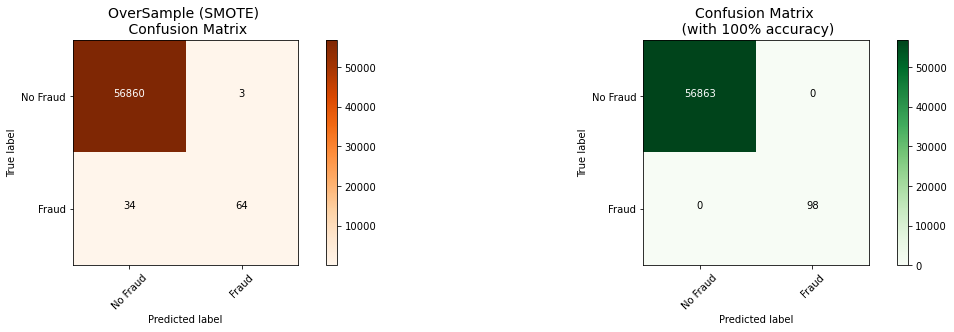

In [60]:
oversample_smote = confusion_matrix(original_ytest, oversample_fraud_predictions)
actual_cm = confusion_matrix(original_ytest, original_ytest)
labels = ['No Fraud', 'Fraud']

fig = plt.figure(figsize=(16,8))

fig.add_subplot(221)
plot_confusion_matrix(oversample_smote, labels, title="OverSample (SMOTE) \n Confusion Matrix", cmap=plt.cm.Oranges)

fig.add_subplot(222)
plot_confusion_matrix(actual_cm, labels, title="Confusion Matrix \n (with 100% accuracy)", cmap=plt.cm.Greens)

In [61]:
print(classification_report(original_ytest, oversample_fraud_predictions, target_names=labels))

              precision    recall  f1-score   support

    No Fraud       1.00      1.00      1.00     56863
       Fraud       0.96      0.65      0.78        98

    accuracy                           1.00     56961
   macro avg       0.98      0.83      0.89     56961
weighted avg       1.00      1.00      1.00     56961



The best model is the neural network model trained on the OverSampled data giving a very high precision, recall and f1 score